<a href="https://colab.research.google.com/github/hamzaraouzi/Generative_adversial_Networks/blob/main/WGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch
import torchvision 
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def imshow(img):
    img =img.cpu()
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

In [ ]:
def weights_initialization(model):
  for m in model.modules():
    if isinstance(m,(nn.Conv2d, nn.ConvTranspose2d,nn.BatchNorm2d)):
      nn.init.normal_(m.weight.data,0.0,0.02)


In [ ]:
class Discriminator(nn.Module):
  def __init__(self, channels_img, features_d):
    super(Discriminator,self).__init__()
    self.disc  = nn.Sequential(
        nn.Conv2d(
            channels_img, features_d, kernel_size=4, stride=2,padding=1
        ),
        nn.LeakyReLU(0.2),
        self.block(features_d  , features_d*2   , 4, 2, 1),
        self.block(features_d*2, features_d*4 , 4, 2, 1),
        self.block(features_d*4, features_d*8 , 4, 2, 1),
        
        nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=2, padding=0)
    )

  def block(self,in_channels, out_channels,kernel_size,stride, padding):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels,kernel_size,stride, padding,
                  bias=False),
        nn.InstanceNorm2d(out_channels, affine=True),
        nn.LeakyReLU(0.2)
    )

  def forward(self, x):
    return self.disc(x)

In [ ]:
x = torch.rand((5,1,64,64))
disc = Discriminator(1,64)
y = disc(x)
print(y.shape)

torch.Size([5, 1, 1, 1])


In [ ]:
class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, features_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # Input: N x channels_noise x 1 x 1

            self.block(channels_noise, features_g * 16, 4, 1, 0),  # img: 4x4
            self.block(features_g * 16, features_g * 8, 4, 2, 1),  # img: 8x8
            self.block(features_g * 8, features_g * 4, 4, 2, 1),  # img: 16x16
            self.block(features_g * 4, features_g * 2, 4, 2, 1),  # img: 32x32
            nn.ConvTranspose2d(
                features_g * 2, channels_img, kernel_size=4, stride=2, padding=1
            ),
            # Output: N x channels_img x 64 x 64
            nn.Tanh(),
        )

    def block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x):
        return self.net(x)


In [ ]:
x = torch.rand((5,100,1,1))
gen = Generator(100,1,64)
y = gen(x)
print(y.shape)

torch.Size([5, 1, 64, 64])


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torchvision


LEARNING_RATE = 5e-5
BATCH_SIZE = 64
IMAGE_SIZE = 64
CHANNELS_IMG = 1
Z_DIM = 128
NUM_EPOCHS = 20
FEATURES_CRITIC = 64
FEATURES_GEN = 64
CRITIC_ITERATIONS = 5
WEIGHT_CLIP = 0.01


transform = transforms.Compose([transforms.Resize(IMAGE_SIZE),
                                transforms.ToTensor(),
                                transforms.Normalize(
                                    [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]
                                ), ])


dataset = datasets.MNIST(root='./data', download=True,
                               transform= transform)

dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)


In [ ]:

gen = Generator(Z_DIM,CHANNELS_IMG,FEATURES_GEN).to(device)
critic = Discriminator(CHANNELS_IMG, FEATURES_CRITIC).to(device)

weights_initialization(gen)
weights_initialization(disc)

Epoch [0/20] Batch 100/938                   Loss D: -0.8901, loss G: 0.6355


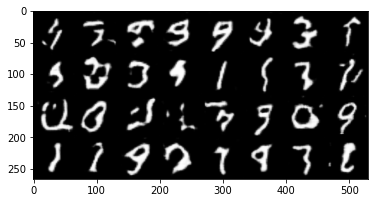

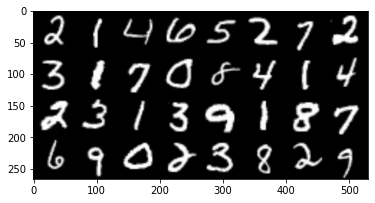

Epoch [0/20] Batch 200/938                   Loss D: -1.0263, loss G: 0.6007


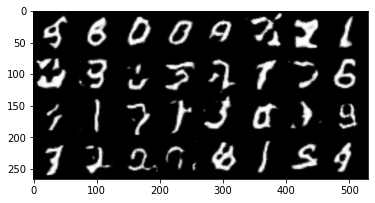

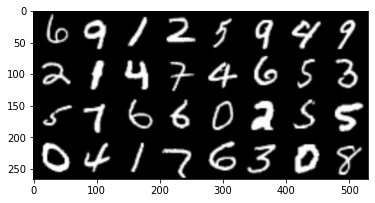

Epoch [0/20] Batch 300/938                   Loss D: -0.9307, loss G: 0.6099


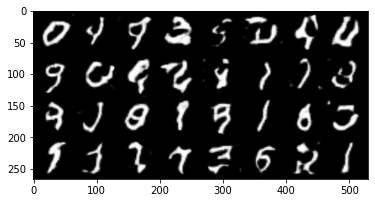

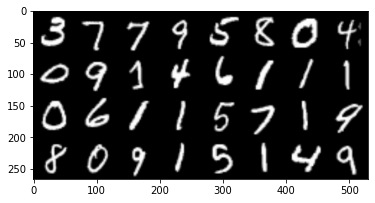

Epoch [0/20] Batch 400/938                   Loss D: -0.9559, loss G: 0.3975


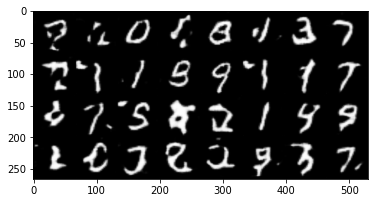

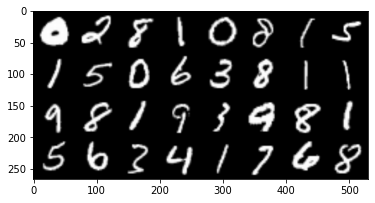

Epoch [0/20] Batch 500/938                   Loss D: -0.9325, loss G: 0.3917


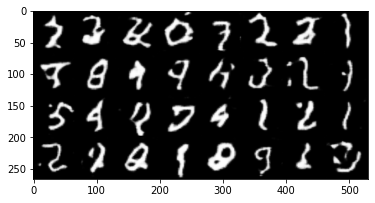

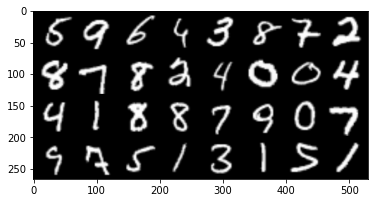

Epoch [0/20] Batch 600/938                   Loss D: -0.8710, loss G: 0.2754


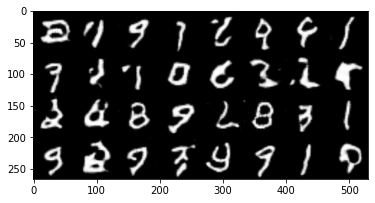

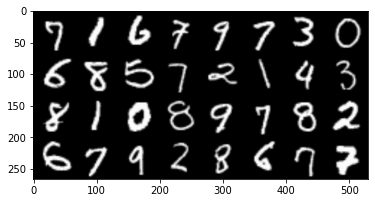

Epoch [0/20] Batch 700/938                   Loss D: -0.8178, loss G: 0.2372


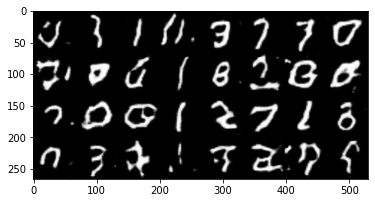

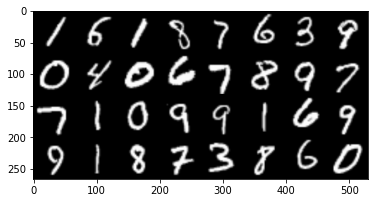

Epoch [0/20] Batch 800/938                   Loss D: -1.0373, loss G: 0.5729


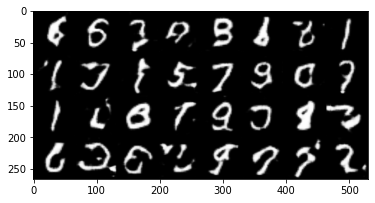

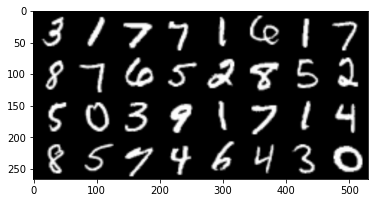

Epoch [0/20] Batch 900/938                   Loss D: -0.9802, loss G: 0.5672


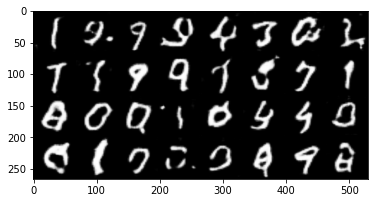

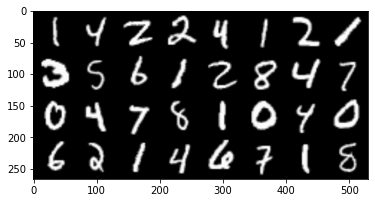

Epoch [1/20] Batch 100/938                   Loss D: -0.9791, loss G: 0.5684


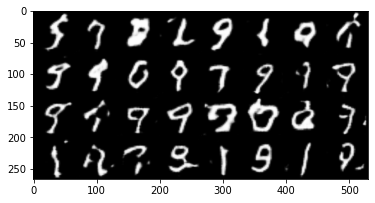

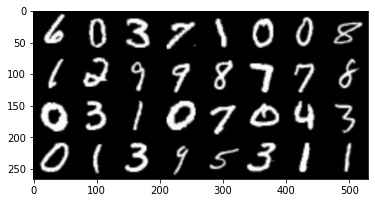

Epoch [1/20] Batch 200/938                   Loss D: -0.9227, loss G: 0.5893


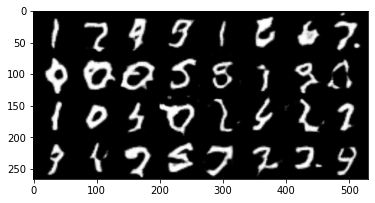

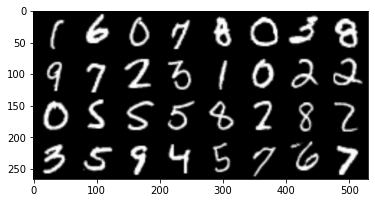

Epoch [1/20] Batch 300/938                   Loss D: -0.8620, loss G: 0.5850


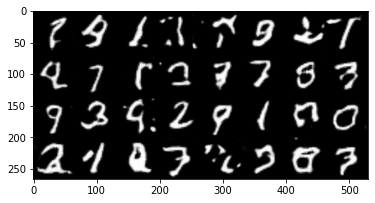

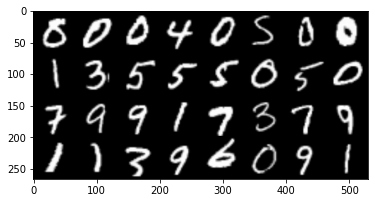

Epoch [1/20] Batch 400/938                   Loss D: -0.8845, loss G: 0.6101


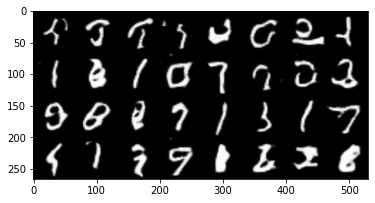

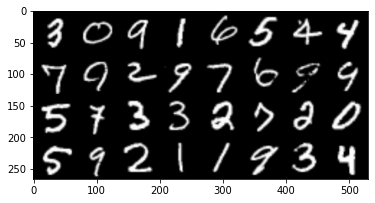

Epoch [1/20] Batch 500/938                   Loss D: -0.9331, loss G: 0.3462


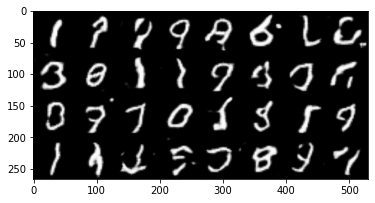

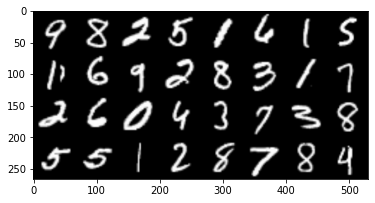

Epoch [1/20] Batch 600/938                   Loss D: -0.8349, loss G: 0.3086


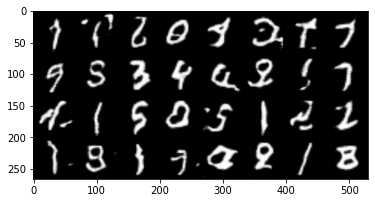

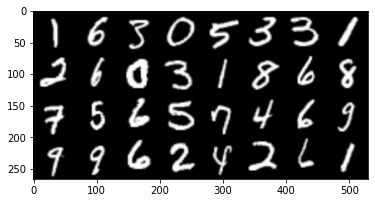

Epoch [1/20] Batch 700/938                   Loss D: -0.8185, loss G: 0.2277


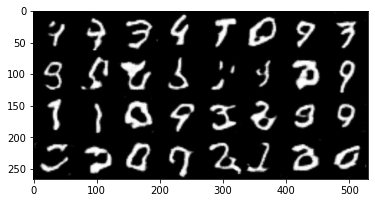

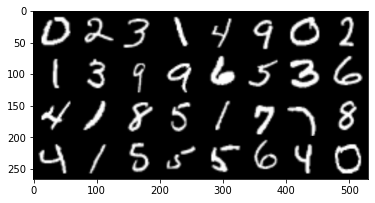

Epoch [1/20] Batch 800/938                   Loss D: -0.9284, loss G: 0.5891


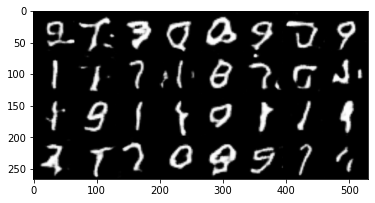

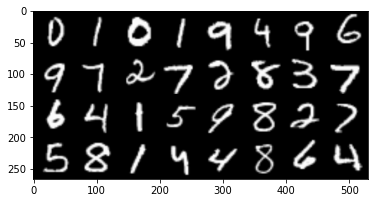

Epoch [1/20] Batch 900/938                   Loss D: -0.9223, loss G: 0.5945


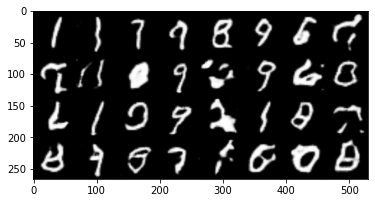

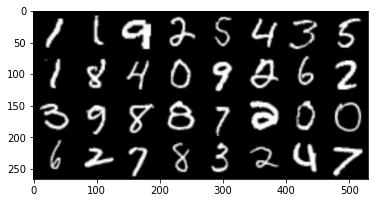

Epoch [2/20] Batch 100/938                   Loss D: -0.9222, loss G: 0.3755


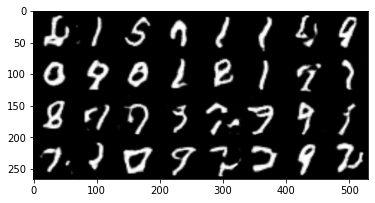

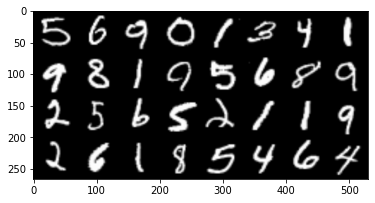

Epoch [2/20] Batch 200/938                   Loss D: -0.8807, loss G: 0.3112


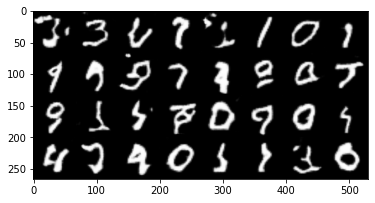

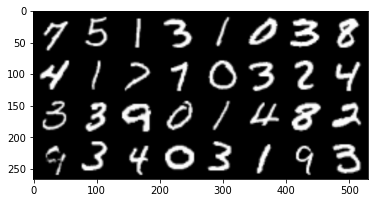

Epoch [2/20] Batch 300/938                   Loss D: -0.8682, loss G: 0.2958


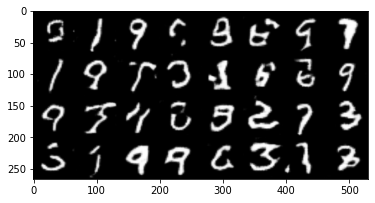

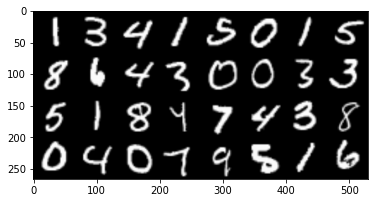

Epoch [2/20] Batch 400/938                   Loss D: -0.9035, loss G: 0.3457


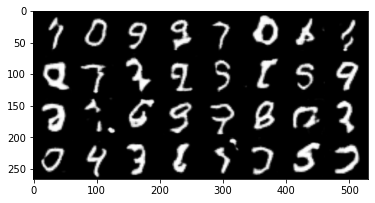

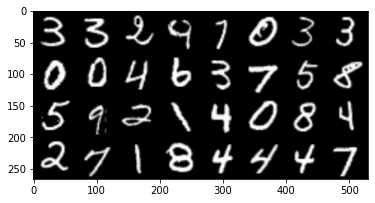

Epoch [2/20] Batch 500/938                   Loss D: -0.9233, loss G: 0.5674


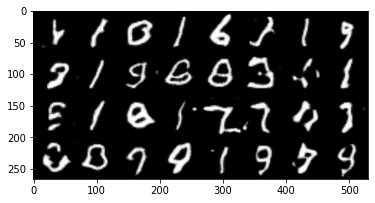

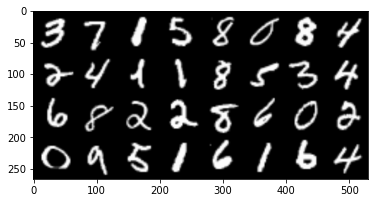

Epoch [2/20] Batch 600/938                   Loss D: -0.9289, loss G: 0.5550


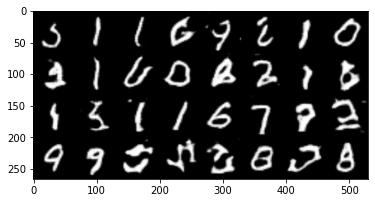

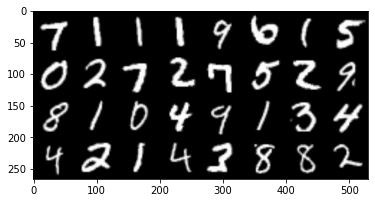

Epoch [2/20] Batch 700/938                   Loss D: -0.8367, loss G: 0.2740


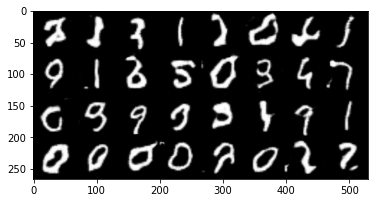

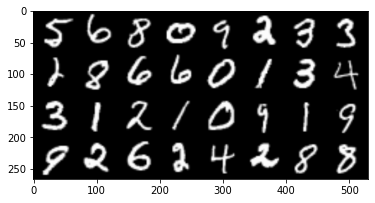

Epoch [2/20] Batch 800/938                   Loss D: -0.9351, loss G: 0.3660


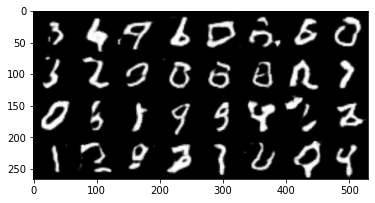

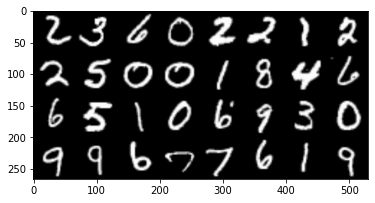

Epoch [2/20] Batch 900/938                   Loss D: -0.7013, loss G: 0.2049


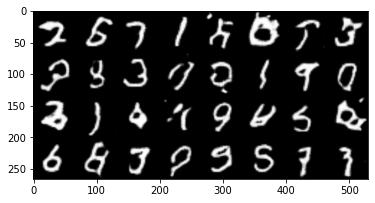

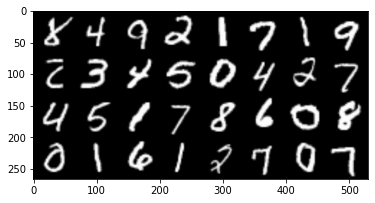

Epoch [3/20] Batch 100/938                   Loss D: -0.7936, loss G: 0.2593


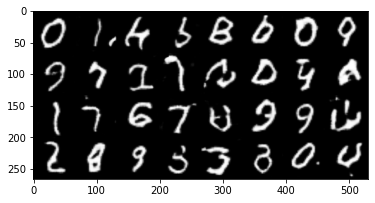

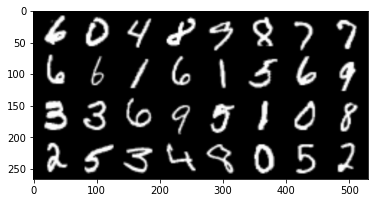

Epoch [3/20] Batch 200/938                   Loss D: -0.8469, loss G: 0.6059


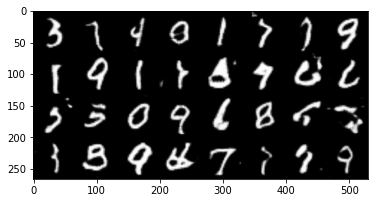

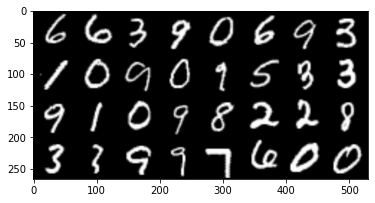

Epoch [3/20] Batch 300/938                   Loss D: -0.8907, loss G: 0.3781


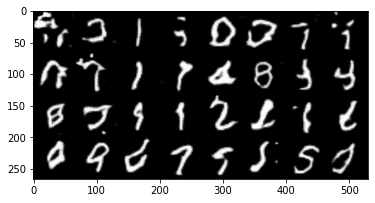

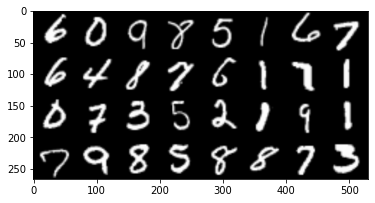

Epoch [3/20] Batch 400/938                   Loss D: -0.9084, loss G: 0.3292


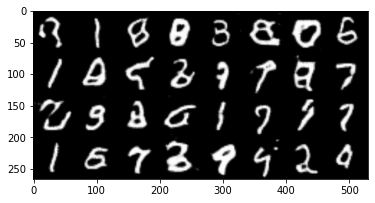

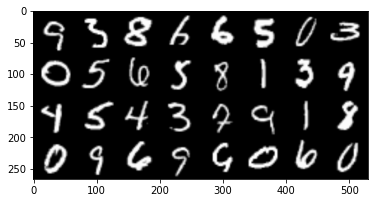

Epoch [3/20] Batch 500/938                   Loss D: -0.8848, loss G: 0.2821


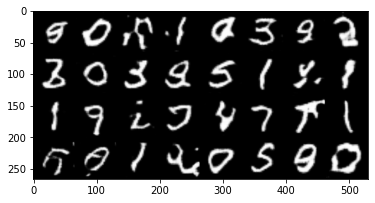

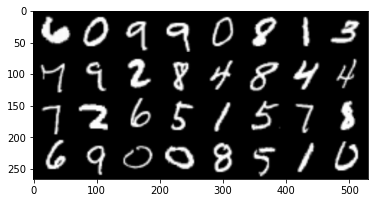

Epoch [3/20] Batch 600/938                   Loss D: -0.8273, loss G: 0.2471


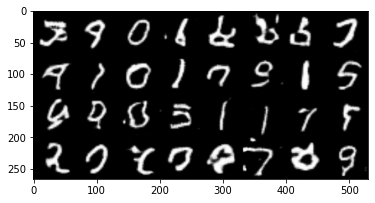

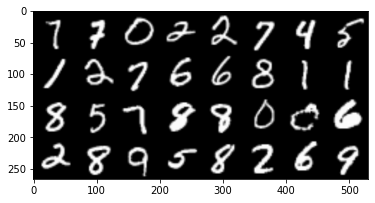

Epoch [3/20] Batch 700/938                   Loss D: -0.8615, loss G: 0.3591


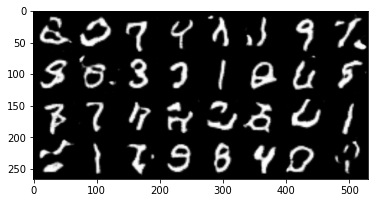

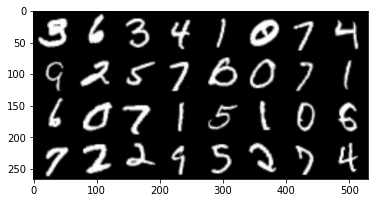

Epoch [3/20] Batch 800/938                   Loss D: -0.8962, loss G: 0.5726


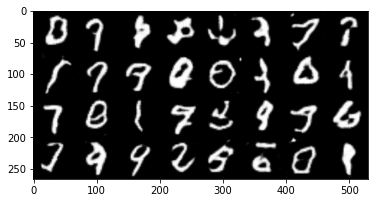

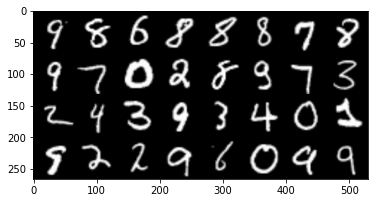

Epoch [3/20] Batch 900/938                   Loss D: -0.9040, loss G: 0.3367


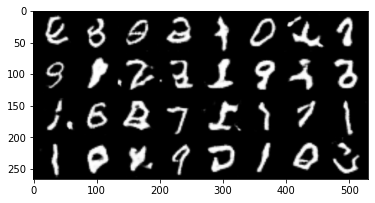

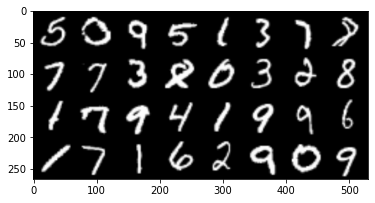

Epoch [4/20] Batch 100/938                   Loss D: -0.7856, loss G: 0.2848


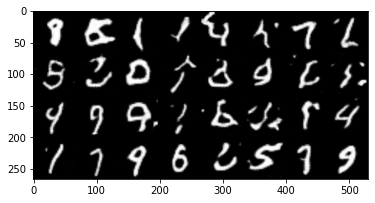

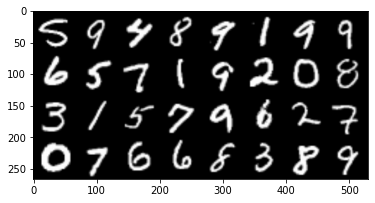

Epoch [4/20] Batch 200/938                   Loss D: -0.8017, loss G: 0.3091


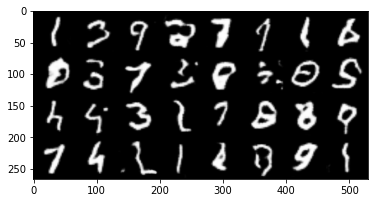

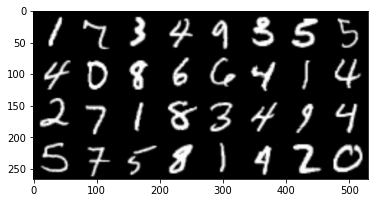

Epoch [4/20] Batch 300/938                   Loss D: -0.8571, loss G: 0.3140


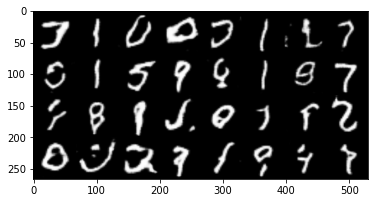

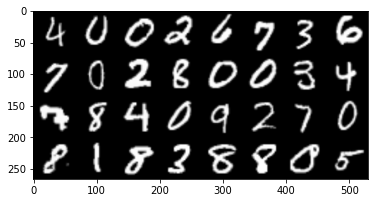

Epoch [4/20] Batch 400/938                   Loss D: -0.8252, loss G: 0.2363


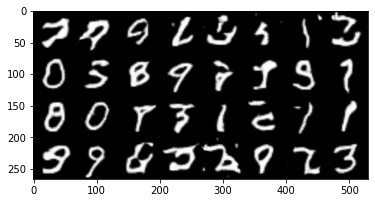

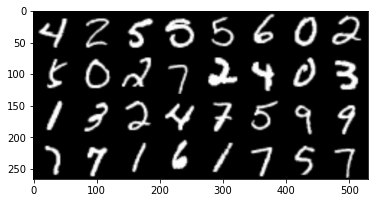

Epoch [4/20] Batch 500/938                   Loss D: -0.6924, loss G: 0.1759


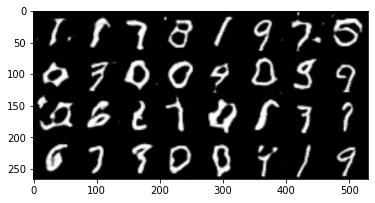

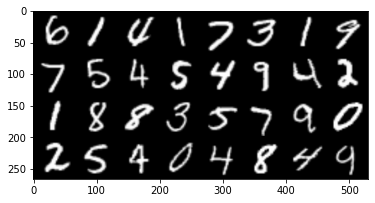

Epoch [4/20] Batch 600/938                   Loss D: -0.8598, loss G: 0.3090


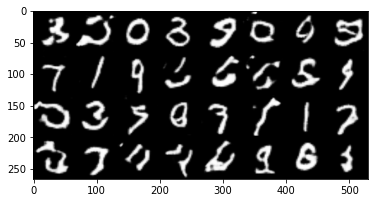

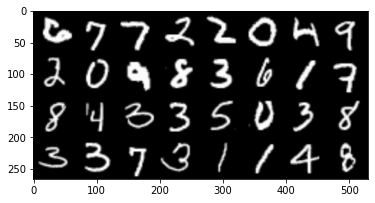

Epoch [4/20] Batch 700/938                   Loss D: -0.7598, loss G: 0.2485


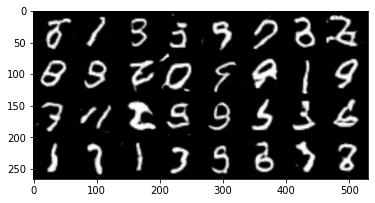

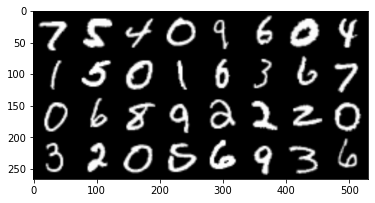

Epoch [4/20] Batch 800/938                   Loss D: -0.8179, loss G: 0.2199


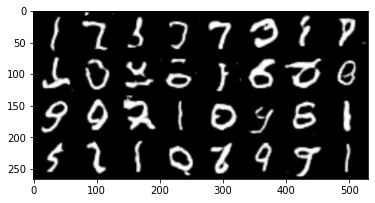

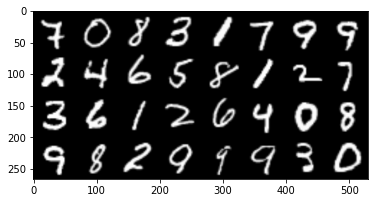

Epoch [4/20] Batch 900/938                   Loss D: -0.8353, loss G: 0.2899


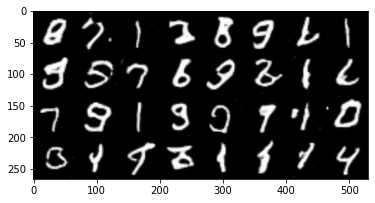

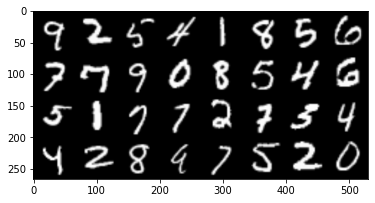

Epoch [5/20] Batch 100/938                   Loss D: -0.9273, loss G: 0.5540


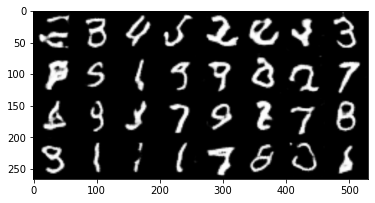

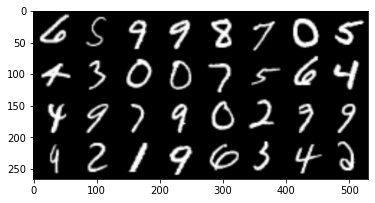

Epoch [5/20] Batch 200/938                   Loss D: -0.7922, loss G: 0.2767


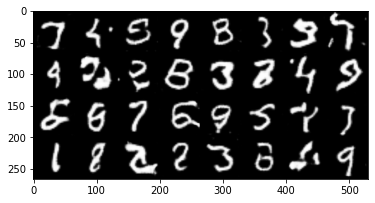

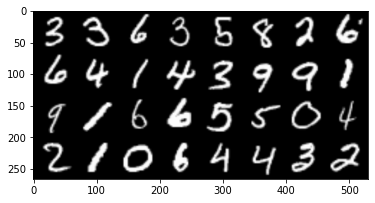

Epoch [5/20] Batch 300/938                   Loss D: -0.8726, loss G: 0.3789


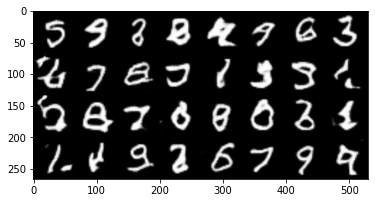

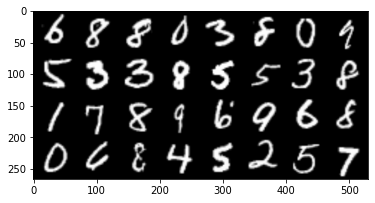

Epoch [5/20] Batch 400/938                   Loss D: -0.7623, loss G: 0.2630


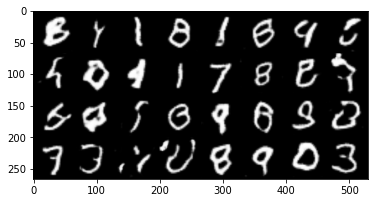

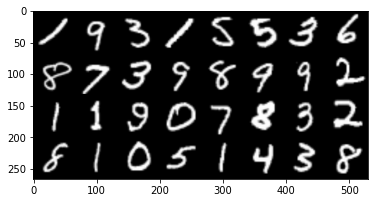

Epoch [5/20] Batch 500/938                   Loss D: -0.8677, loss G: 0.4249


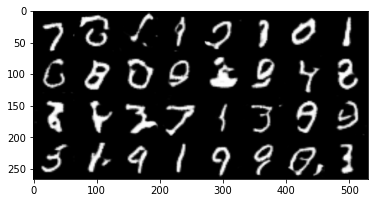

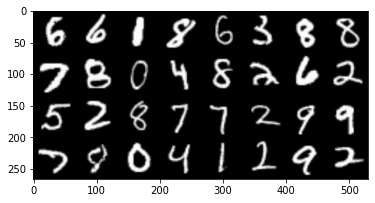

Epoch [5/20] Batch 600/938                   Loss D: -0.7568, loss G: 0.2812


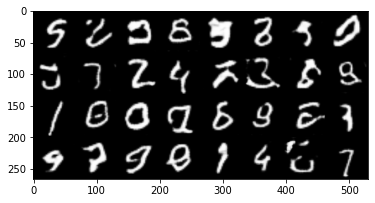

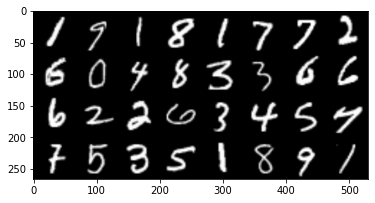

Epoch [5/20] Batch 700/938                   Loss D: -0.7776, loss G: 0.2320


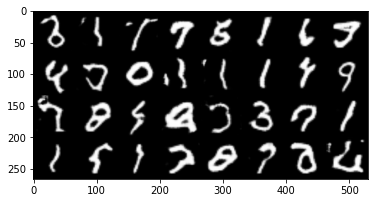

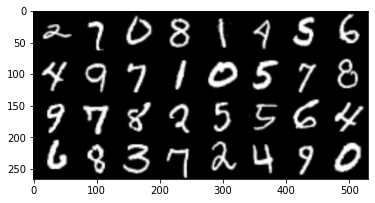

Epoch [5/20] Batch 800/938                   Loss D: -0.7535, loss G: 0.5372


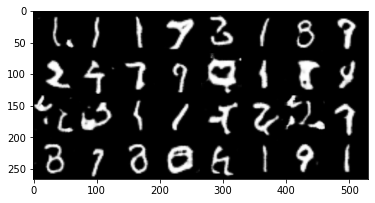

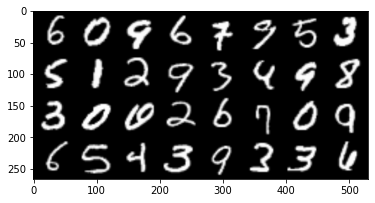

Epoch [5/20] Batch 900/938                   Loss D: -0.7321, loss G: 0.5105


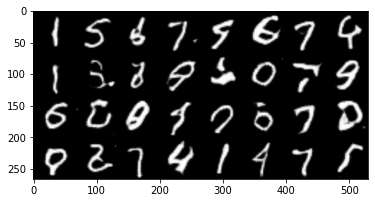

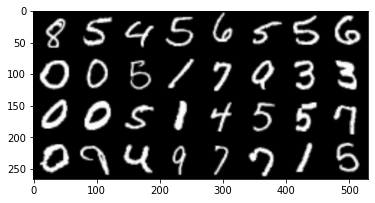

Epoch [6/20] Batch 100/938                   Loss D: -0.7915, loss G: 0.2787


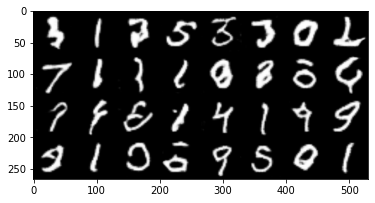

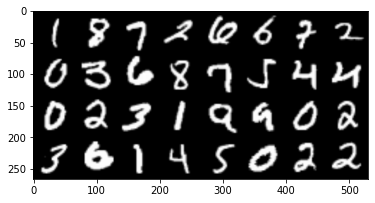

Epoch [6/20] Batch 200/938                   Loss D: -0.7791, loss G: 0.5513


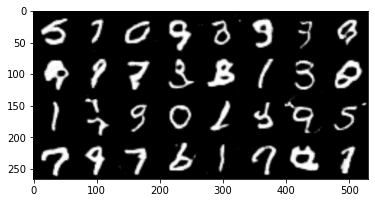

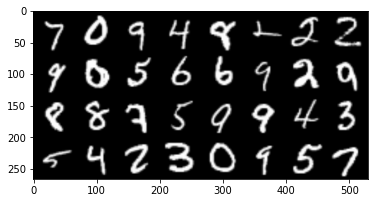

Epoch [6/20] Batch 300/938                   Loss D: -0.7107, loss G: 0.5432


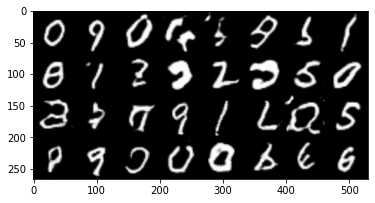

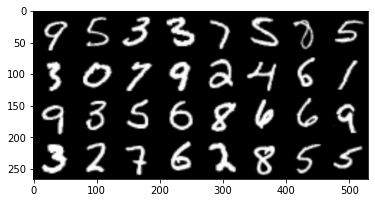

Epoch [6/20] Batch 400/938                   Loss D: -0.7609, loss G: 0.5283


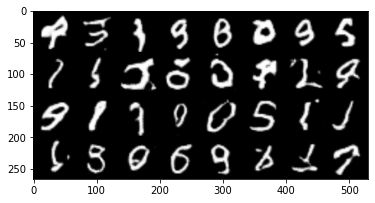

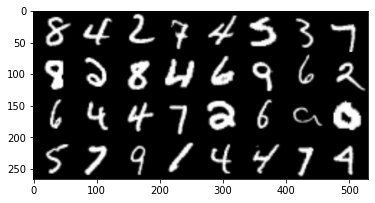

Epoch [6/20] Batch 500/938                   Loss D: -0.7013, loss G: 0.5481


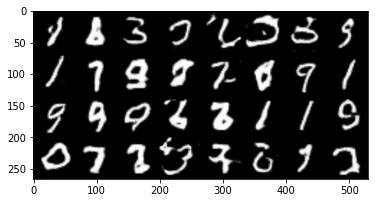

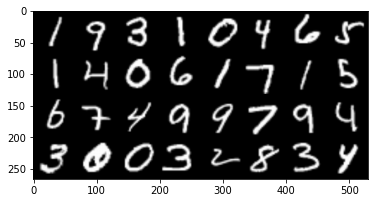

Epoch [6/20] Batch 600/938                   Loss D: -0.7953, loss G: 0.2489


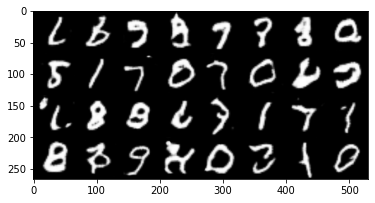

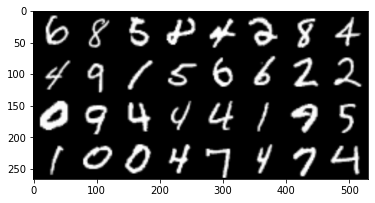

Epoch [6/20] Batch 700/938                   Loss D: -0.7080, loss G: 0.2120


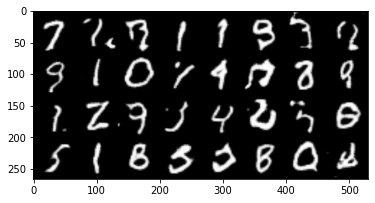

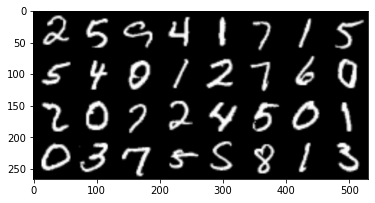

Epoch [6/20] Batch 800/938                   Loss D: -0.7259, loss G: 0.2071


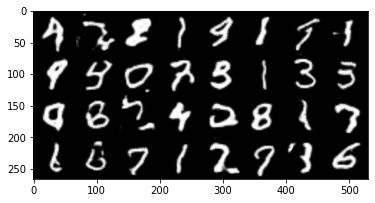

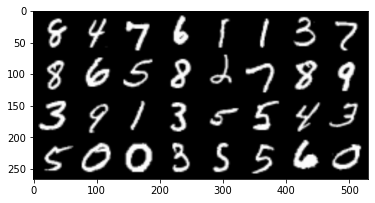

Epoch [6/20] Batch 900/938                   Loss D: -0.7384, loss G: 0.1973


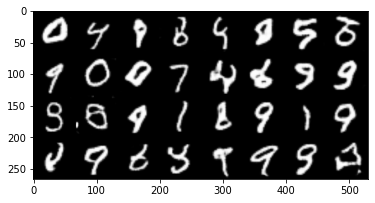

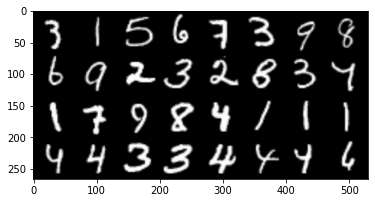

Epoch [7/20] Batch 100/938                   Loss D: -0.7072, loss G: 0.5246


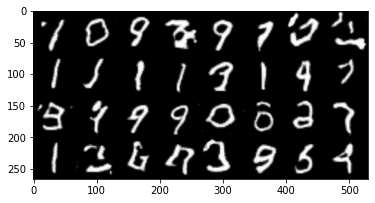

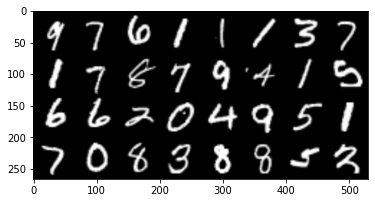

Epoch [7/20] Batch 200/938                   Loss D: -0.7323, loss G: 0.5102


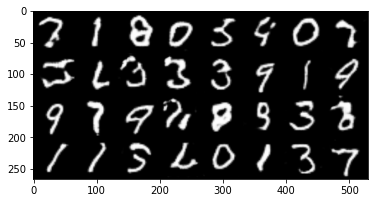

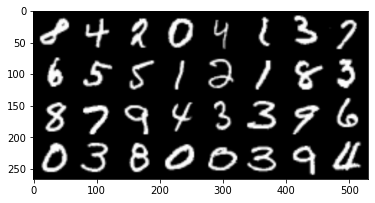

Epoch [7/20] Batch 300/938                   Loss D: -0.7141, loss G: 0.5368


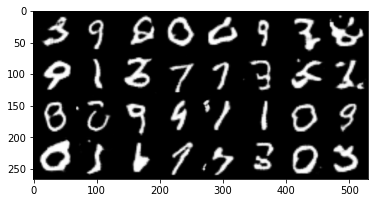

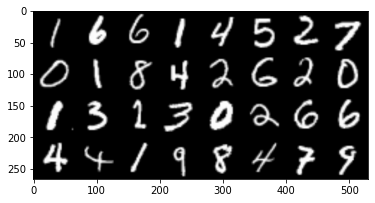

Epoch [7/20] Batch 400/938                   Loss D: -0.7846, loss G: 0.5625


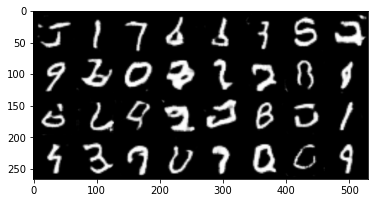

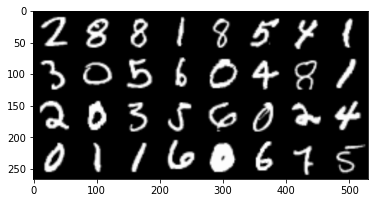

Epoch [7/20] Batch 500/938                   Loss D: -0.7514, loss G: 0.5531


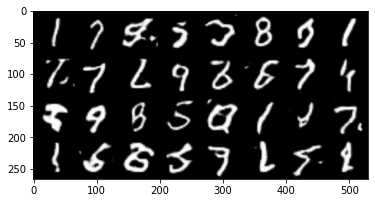

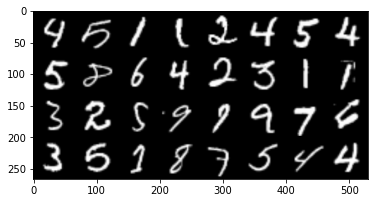

Epoch [7/20] Batch 600/938                   Loss D: -0.8104, loss G: 0.5353


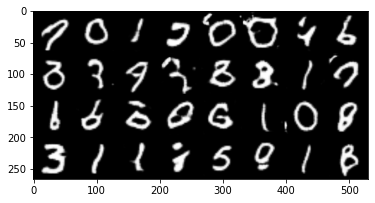

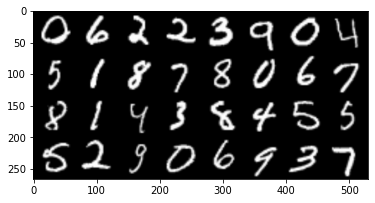

Epoch [7/20] Batch 700/938                   Loss D: -0.7247, loss G: 0.2200


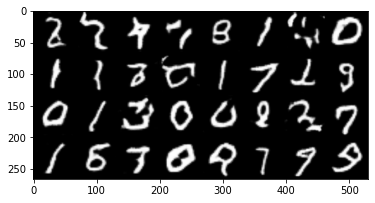

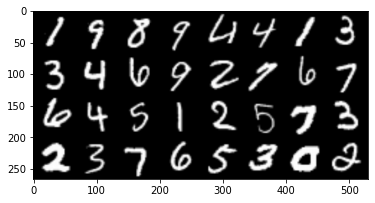

Epoch [7/20] Batch 800/938                   Loss D: -0.7147, loss G: 0.5291


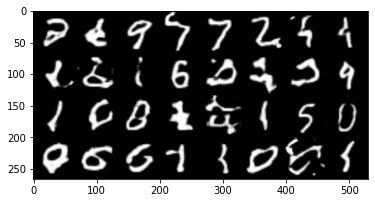

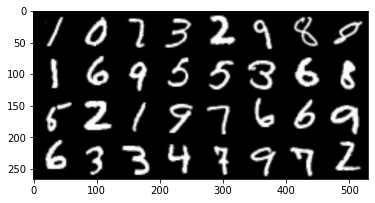

Epoch [7/20] Batch 900/938                   Loss D: -0.8450, loss G: 0.5399


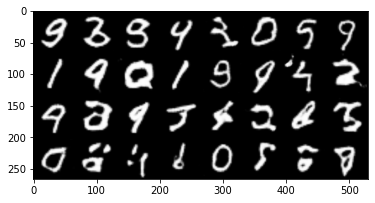

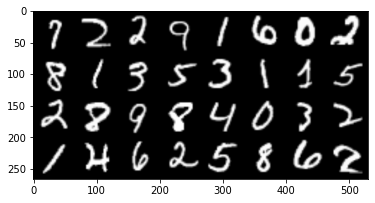

Epoch [8/20] Batch 100/938                   Loss D: -0.7910, loss G: 0.5339


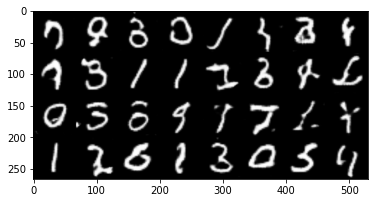

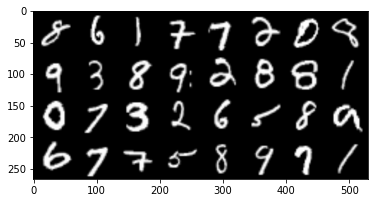

Epoch [8/20] Batch 200/938                   Loss D: -0.7371, loss G: 0.2669


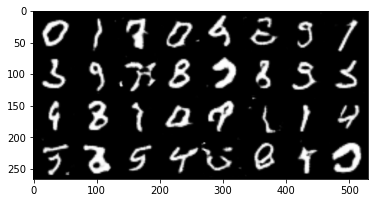

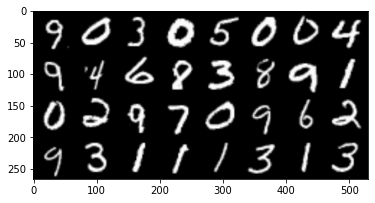

Epoch [8/20] Batch 300/938                   Loss D: -0.7604, loss G: 0.2487


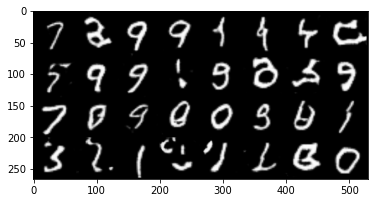

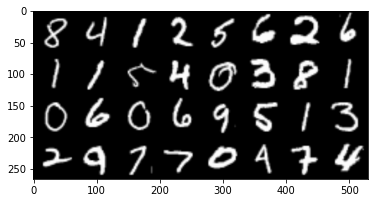

Epoch [8/20] Batch 400/938                   Loss D: -0.7327, loss G: 0.2644


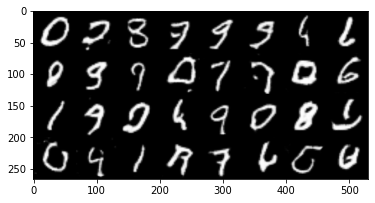

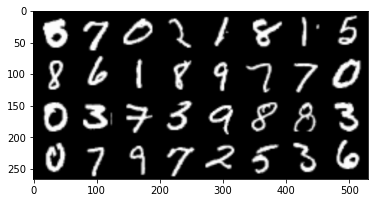

Epoch [8/20] Batch 500/938                   Loss D: -0.7287, loss G: 0.2167


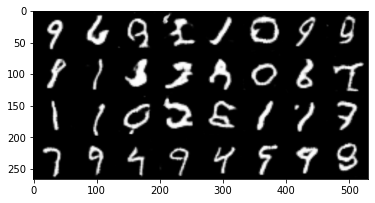

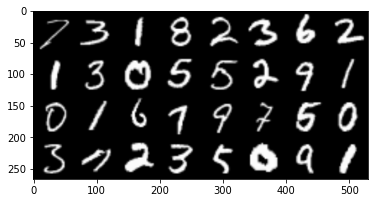

Epoch [8/20] Batch 600/938                   Loss D: -0.7742, loss G: 0.2939


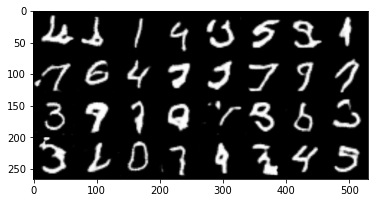

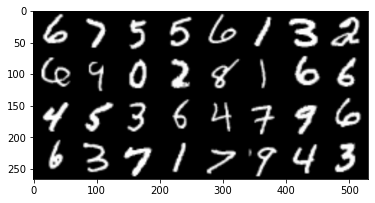

Epoch [8/20] Batch 700/938                   Loss D: -0.7478, loss G: 0.2231


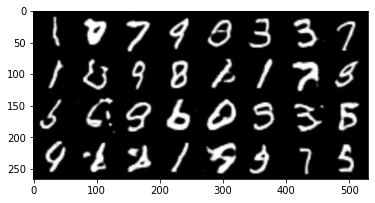

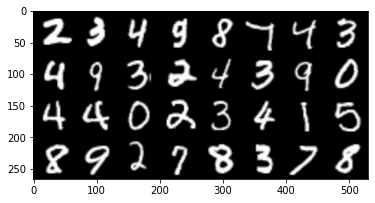

Epoch [8/20] Batch 800/938                   Loss D: -0.6938, loss G: 0.2451


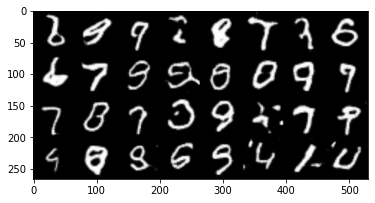

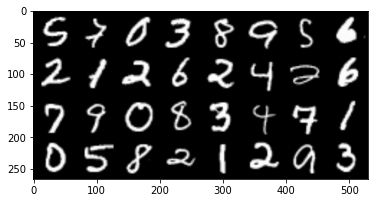

Epoch [8/20] Batch 900/938                   Loss D: -0.7211, loss G: 0.2754


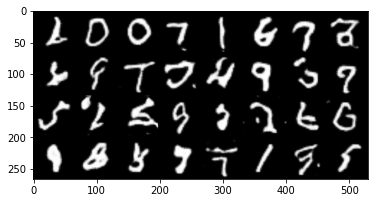

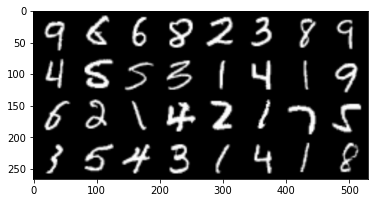

Epoch [9/20] Batch 100/938                   Loss D: -0.7300, loss G: 0.2085


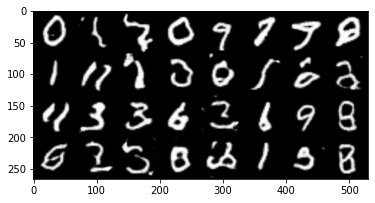

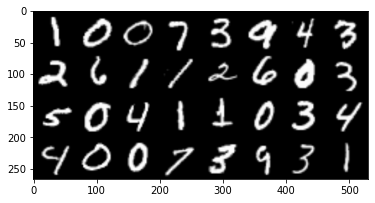

Epoch [9/20] Batch 200/938                   Loss D: -0.7473, loss G: 0.2486


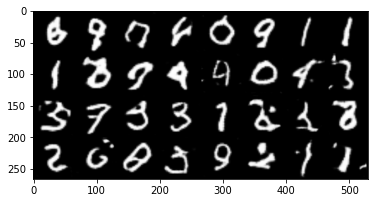

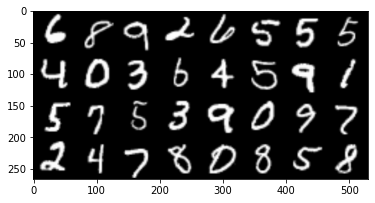

Epoch [9/20] Batch 300/938                   Loss D: -0.7279, loss G: 0.5437


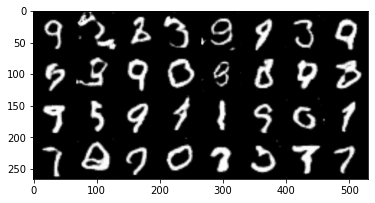

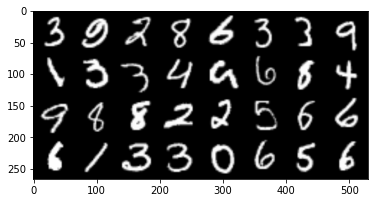

Epoch [9/20] Batch 400/938                   Loss D: -0.6938, loss G: 0.5160


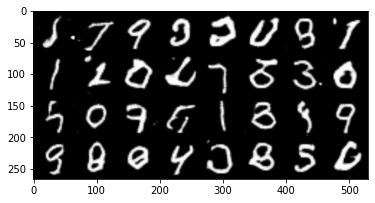

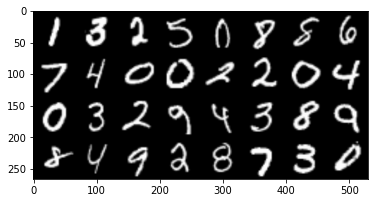

Epoch [9/20] Batch 500/938                   Loss D: -0.6767, loss G: 0.4928


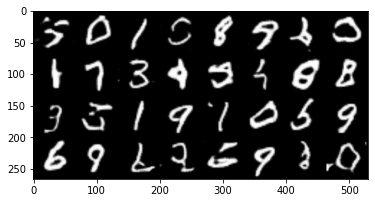

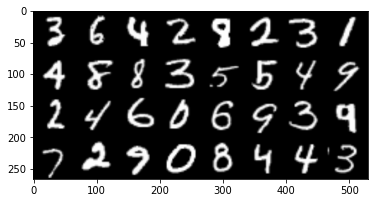

Epoch [9/20] Batch 600/938                   Loss D: -0.7154, loss G: 0.5265


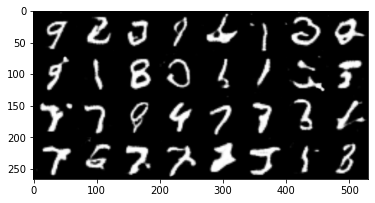

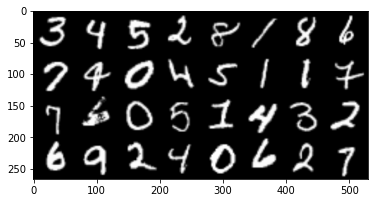

Epoch [9/20] Batch 700/938                   Loss D: -0.6960, loss G: 0.5414


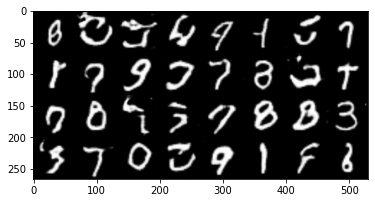

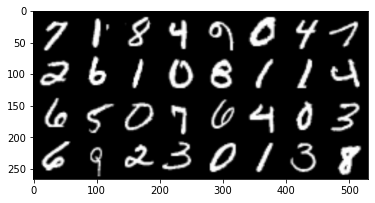

Epoch [9/20] Batch 800/938                   Loss D: -0.6601, loss G: 0.5197


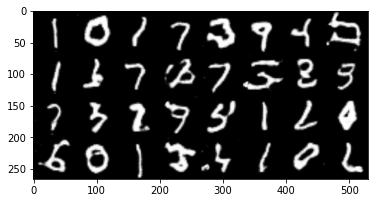

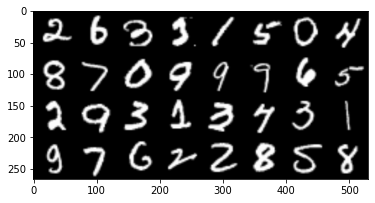

Epoch [9/20] Batch 900/938                   Loss D: -0.6474, loss G: 0.4903


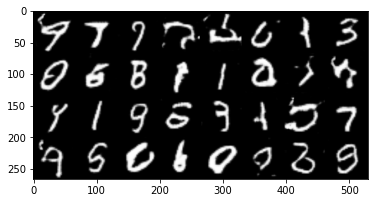

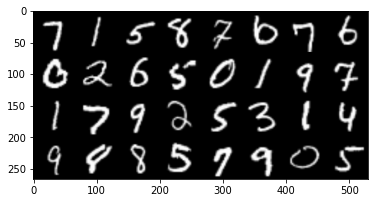

Epoch [10/20] Batch 100/938                   Loss D: -0.6470, loss G: 0.5314


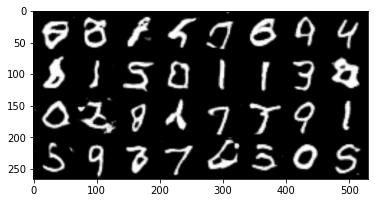

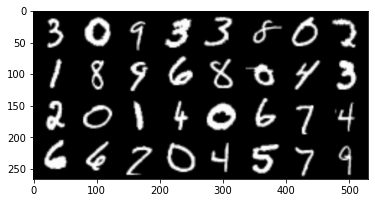

Epoch [10/20] Batch 200/938                   Loss D: -0.7009, loss G: 0.5087


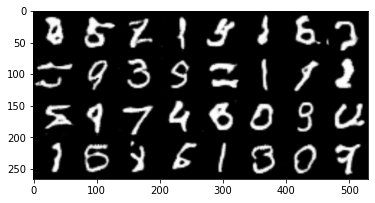

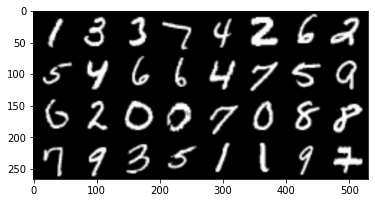

Epoch [10/20] Batch 300/938                   Loss D: -0.6870, loss G: 0.2156


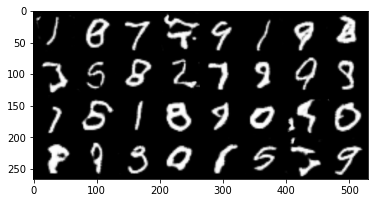

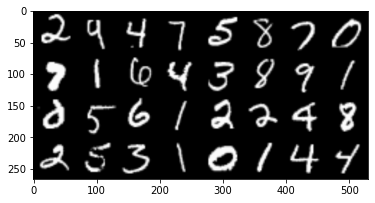

Epoch [10/20] Batch 400/938                   Loss D: -0.7423, loss G: 0.2571


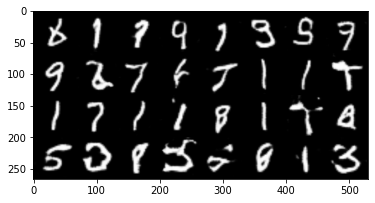

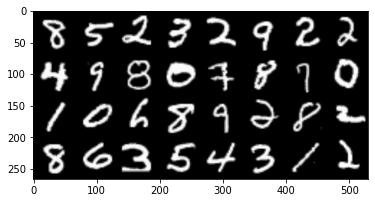

Epoch [10/20] Batch 500/938                   Loss D: -0.6188, loss G: 0.5415


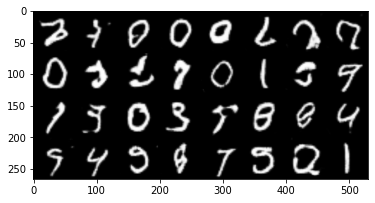

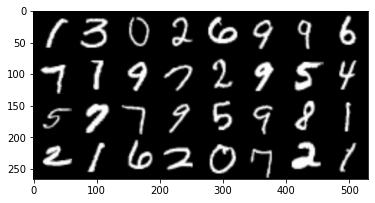

Epoch [10/20] Batch 600/938                   Loss D: -0.6584, loss G: 0.5411


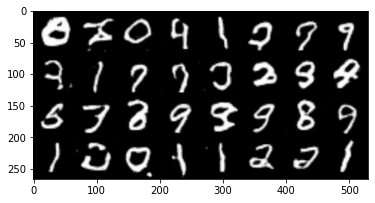

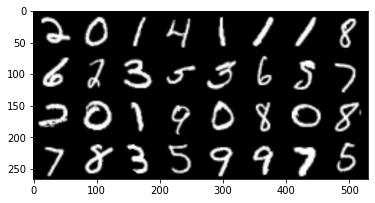

Epoch [10/20] Batch 700/938                   Loss D: -0.6132, loss G: 0.4983


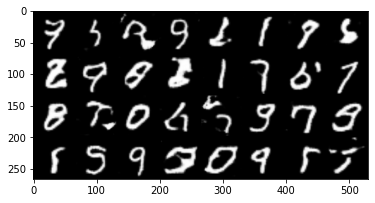

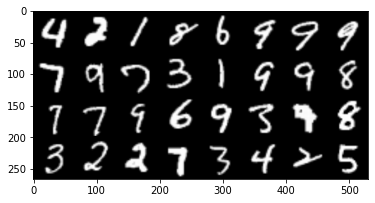

Epoch [10/20] Batch 800/938                   Loss D: -0.6897, loss G: 0.2352


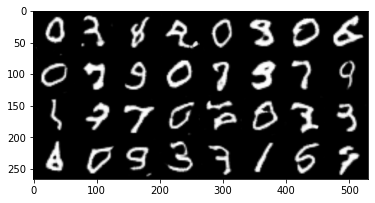

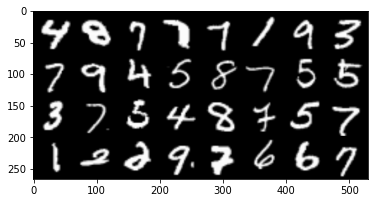

Epoch [10/20] Batch 900/938                   Loss D: -0.5935, loss G: 0.5017


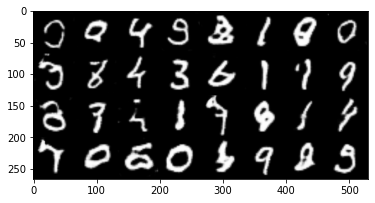

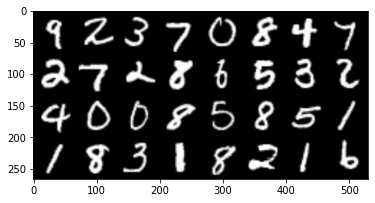

Epoch [11/20] Batch 100/938                   Loss D: -0.6276, loss G: 0.5130


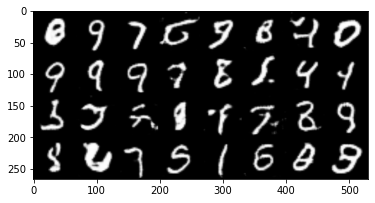

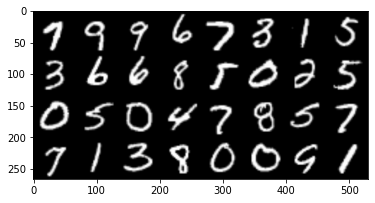

Epoch [11/20] Batch 200/938                   Loss D: -0.6978, loss G: 0.2235


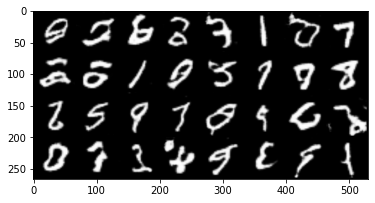

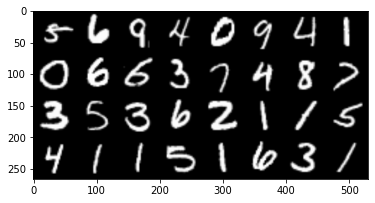

Epoch [11/20] Batch 300/938                   Loss D: -0.7050, loss G: 0.2035


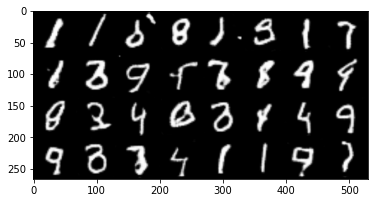

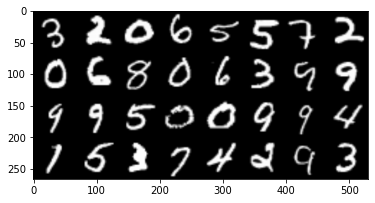

Epoch [11/20] Batch 400/938                   Loss D: -0.7460, loss G: 0.4484


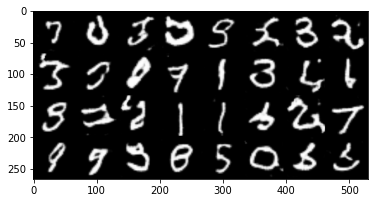

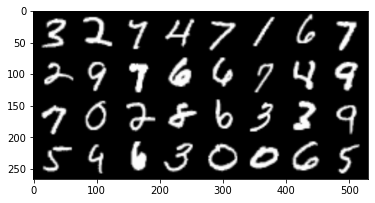

Epoch [11/20] Batch 500/938                   Loss D: -0.6453, loss G: 0.5391


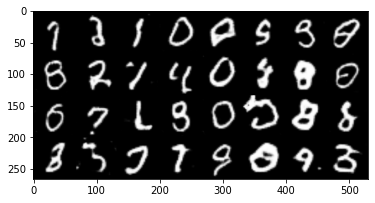

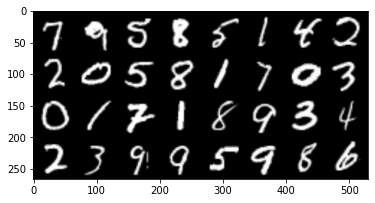

Epoch [11/20] Batch 600/938                   Loss D: -0.6430, loss G: 0.5041


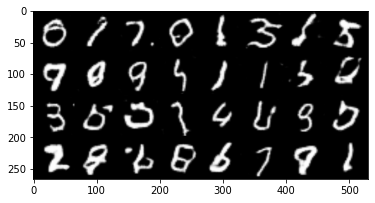

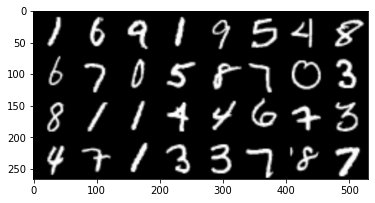

Epoch [11/20] Batch 700/938                   Loss D: -0.6466, loss G: 0.5328


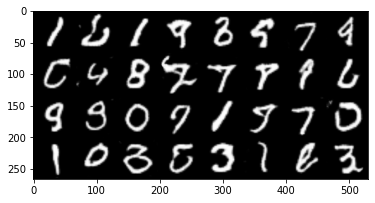

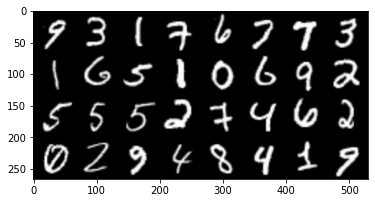

Epoch [11/20] Batch 800/938                   Loss D: -0.7234, loss G: 0.4493


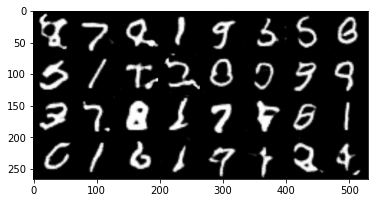

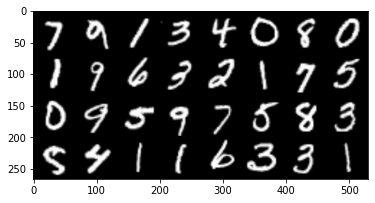

Epoch [11/20] Batch 900/938                   Loss D: -0.6748, loss G: 0.1738


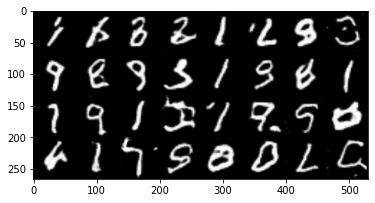

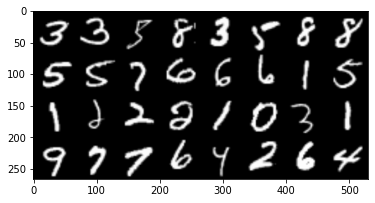

Epoch [12/20] Batch 100/938                   Loss D: -0.6910, loss G: 0.2413


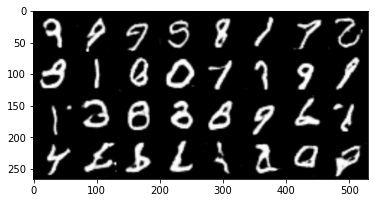

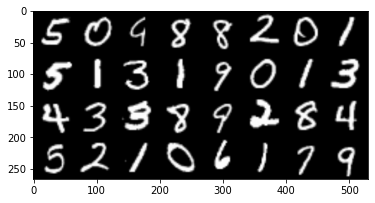

Epoch [12/20] Batch 200/938                   Loss D: -0.6504, loss G: 0.1990


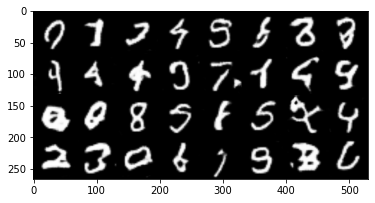

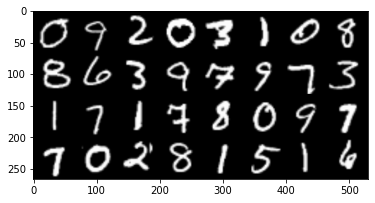

Epoch [12/20] Batch 300/938                   Loss D: -0.7145, loss G: 0.1593


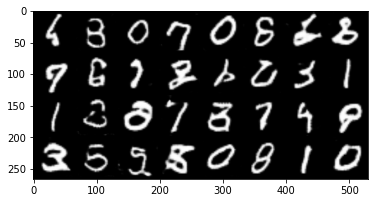

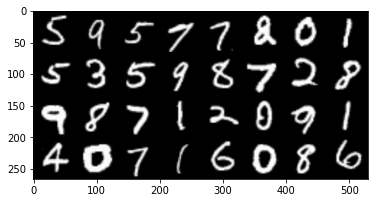

In [ ]:

opt_gen = optim.RMSprop(gen.parameters(), lr=LEARNING_RATE)
opt_critic = optim.RMSprop(critic.parameters(), lr=LEARNING_RATE)


gen.train()
critic.train()

for epoch in range(NUM_EPOCHS):
    # Target labels not needed! <3 unsupervised
    for batch_idx, (data, _) in enumerate(dataloader):
        data = data.to(device)
        cur_batch_size = data.shape[0]

        # Train Critic: max E[critic(real)] - E[critic(fake)]
        for _ in range(CRITIC_ITERATIONS):
            noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(device)
            fake = gen(noise)
            critic_real = critic(data).reshape(-1)
            critic_fake = critic(fake).reshape(-1)
            loss_critic = -(torch.mean(critic_real) - torch.mean(critic_fake))
            critic.zero_grad()
            loss_critic.backward(retain_graph=True)
            opt_critic.step()

            # clip critic weights between -0.01, 0.01
            for p in critic.parameters():
                p.data.clamp_(-WEIGHT_CLIP, WEIGHT_CLIP)

        # Train Generator: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
        gen_fake = critic(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        # Print losses occasionally and print to tensorboard
        if batch_idx % 100 == 0 and batch_idx > 0:
            gen.eval()
            critic.eval()
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(dataloader)} \
                  Loss D: {loss_critic:.4f}, loss G: {loss_gen:.4f}"
            )

            with torch.no_grad():
                fake = gen(noise)
                # take out (up to) 32 examples
                img_grid_real = torchvision.utils.make_grid(
                    data[:32], normalize=True
                )
                img_grid_fake = torchvision.utils.make_grid(
                    fake[:32], normalize=True
                ) 
                imshow(img_grid_fake)
                imshow(img_grid_real)

          
            gen.train()
            critic.train()